<a href="https://colab.research.google.com/github/nferrence4/Senior-IS/blob/main/RetinaNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Detectron repo for RetinaNet model

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15837, done.
remote: Counting objects: 100% (56/56), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 15837 (delta 30), reused 12 (delta 12), pack-reused 15781 (from 2)
Receiving objects: 100% (15837/15837), 6.40 MiB | 19.17 MiB/s, done.
Resolving deltas: 100% (11537/11537), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment


In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.5 ; cuda:  cu124
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Import libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# Import detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Download Dataset URL from RoboFlow

In [ ]:
!curl -L "https://universe.roboflow.com/ds/tehU3VdMGz?key=p2CtKMmj7n" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0   1687      0 --:--:-- --:--:-- --:--:--  1688
100 80.5M  100 80.5M    0     0  10.2M      0  0:00:07  0:00:07 --:--:-- 18.0M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/_annotations.coco.json  
 extracting: test/perintah-pilihan-memasuki-salah-satu-jalur--64-_jpg.rf.ca52a211513d363023f41d44160b6c6a.jpg  
 extracting: test/perintah-pilihan-memasuki-salah-satu-jalur--66-_jpg.rf.d7da089766ebc56b25d725d23400241d.jpg  
 extracting: test/perintah-pilihan-memasuki-salah-satu-jalur--67-_jpg.rf.1f52990ceee7e516138ad06c843397dc.jpg  
 extracting: test/perintah-pilihan-memasuki-salah-satu-jalur--68-_jpg.rf.de641d7695fdd5741b174a0c424c3e68.jpg  
 extracting: test/perintah-pilihan-memasuki-salah-satu-jalur--69-_jpg.rf.92

In [ ]:
# Register annotations for model to train/test on
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [02/27 17:44:35 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 17:44:35 d2.data.datasets.coco]: Loaded 1376 images in COCO format from /content/train/_annotations.coco.json


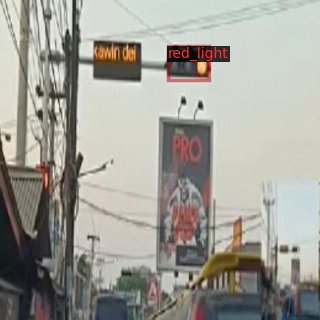

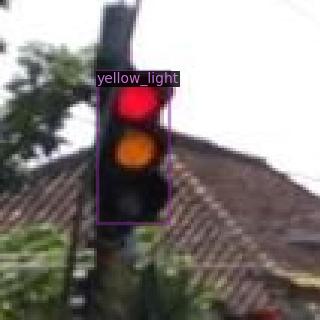

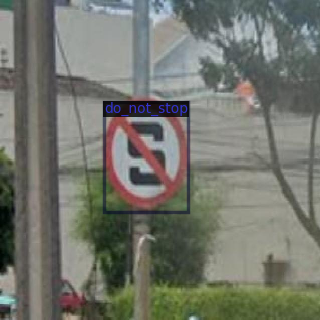

In [ ]:
# Visualize training data
# If dataset cannot be seen they did not register correctly check folder path
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

# Train

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml")) # Model directory can be copied from detectron repo and changed here
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml") # Change model directory here, the model paths must match
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[02/27 16:48:55 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

  pixel_mean
  pixel_std


[02/27 16:48:55 d2.engine.train_loop]: Starting training from iteration 0
[02/27 16:48:58 d2.utils.events]:  eta: 0:00:41  iter: 19  total_loss: 1.597  loss_cls: 1.369  loss_box_reg: 0.2095    time: 0.1429  last_time: 0.1673  data_time: 0.0115  last_data_time: 0.0039   lr: 1.6068e-05  max_mem: 2759M
[02/27 16:49:01 d2.utils.events]:  eta: 0:00:38  iter: 39  total_loss: 1.477  loss_cls: 1.189  loss_box_reg: 0.1984    time: 0.1447  last_time: 0.1439  data_time: 0.0042  last_data_time: 0.0044   lr: 3.2718e-05  max_mem: 2764M
[02/27 16:49:04 d2.utils.events]:  eta: 0:00:34  iter: 59  total_loss: 1.278  loss_cls: 1.06  loss_box_reg: 0.1796    time: 0.1435  last_time: 0.1674  data_time: 0.0044  last_data_time: 0.0045   lr: 4.9367e-05  max_mem: 2764M
[02/27 16:49:07 d2.utils.events]:  eta: 0:00:32  iter: 79  total_loss: 1.068  loss_cls: 0.7904  loss_box_reg: 0.1937    time: 0.1454  last_time: 0.1675  data_time: 0.0041  last_data_time: 0.0038   lr: 6.6017e-05  max_mem: 2764M
[02/27 16:49:10 d2

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# Evaluate

In [ ]:
# Test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[02/27 16:49:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[02/27 16:49:46 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.


/usr/local/lib/python3.11/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

WARNING [02/27 16:49:46 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [02/27 16:49:46 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 16:49:46 d2.data.datasets.coco]: Loaded 229 images in COCO format from /content/test/_annotations.coco.json
[02/27 16:49:46 d2.data.build]: Distribution of instances among all 22 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|  road-signs   | 0            |   bus_stop    | 75           | do_not_enter  | 0            |
|  do_not_stop  | 0            | do_not_turn_l | 0            | do_not_turn_r | 0            |
| do_not_u_turn | 0            | enter_left_.. | 0            |  green_light  | 0            |
| left_right_.. | 9

AssertionError: A prediction has class=23, but the dataset only has 22 classes and predicted class id should be in [0, 21].

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

[02/27 04:34:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [ ]:
test_metadata = MetadataCatalog.get("my_dataset_test")

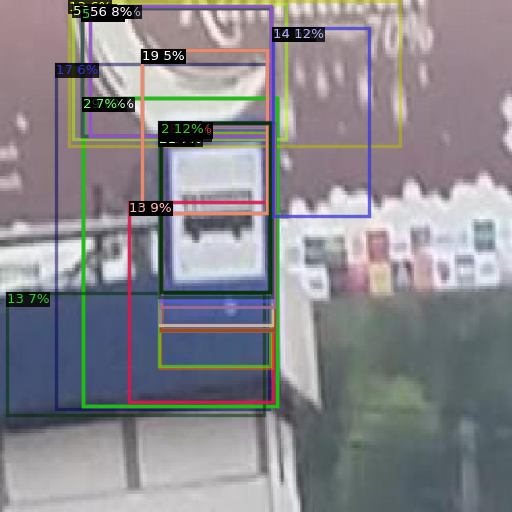

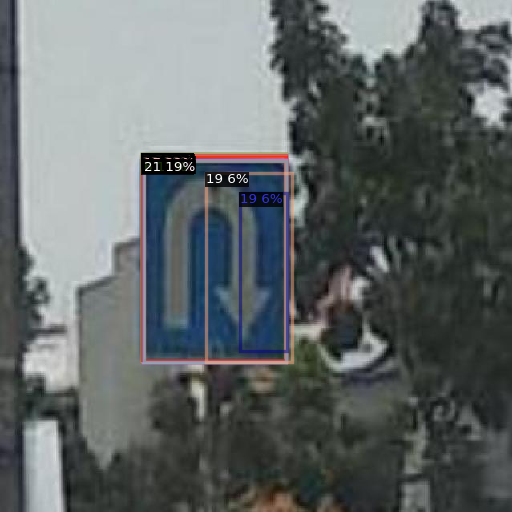

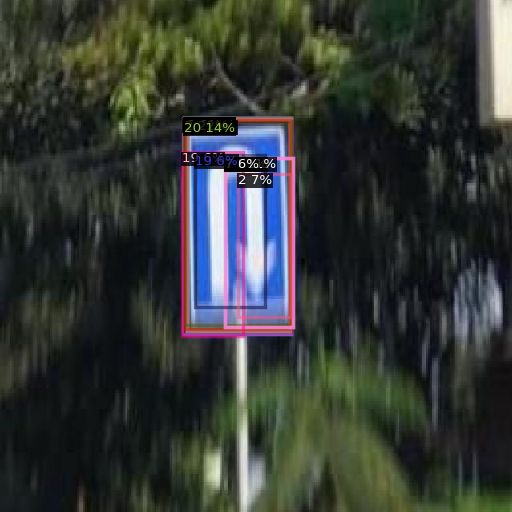

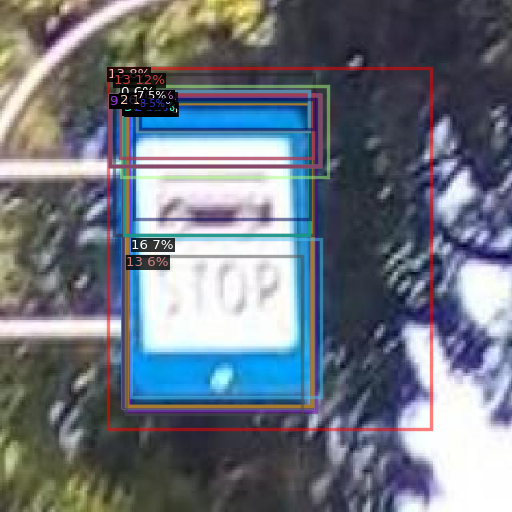

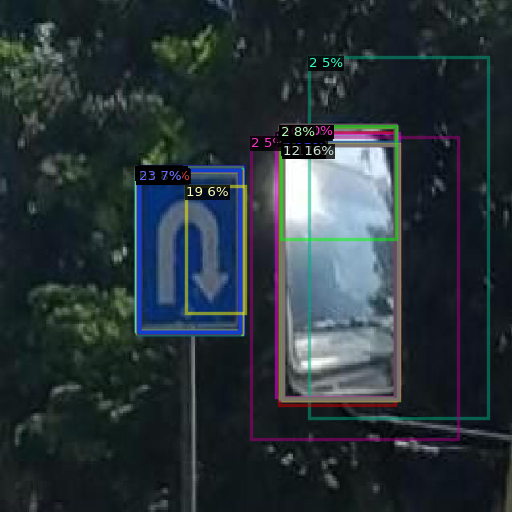

...

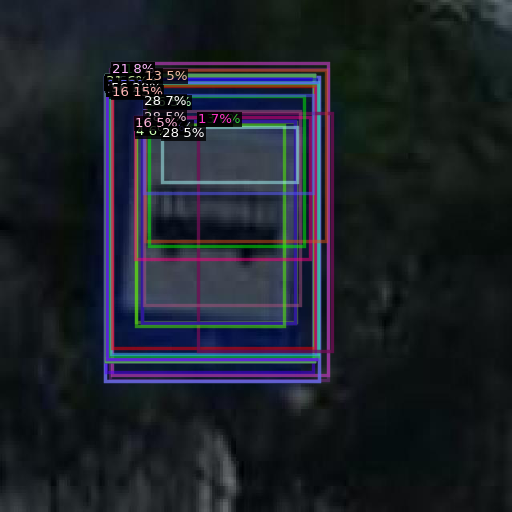

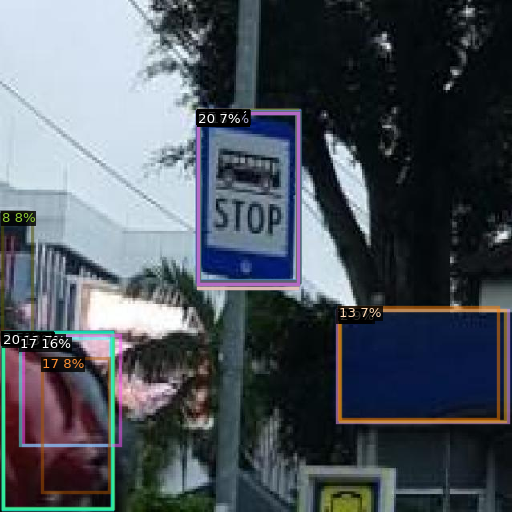

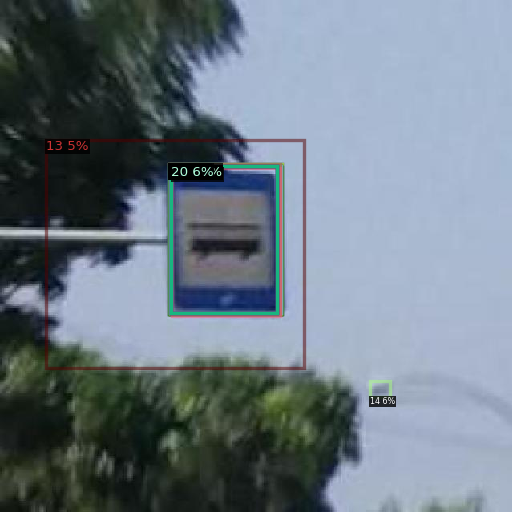

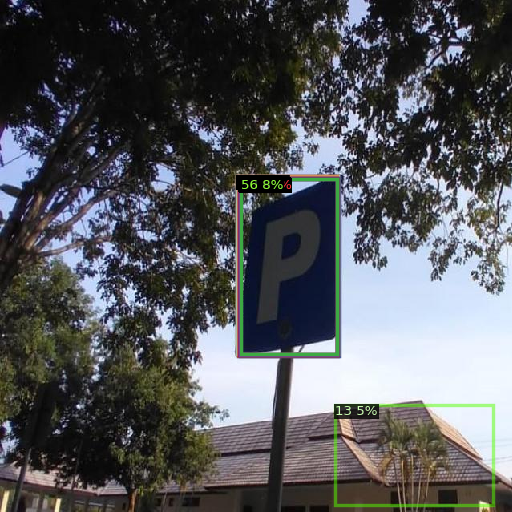

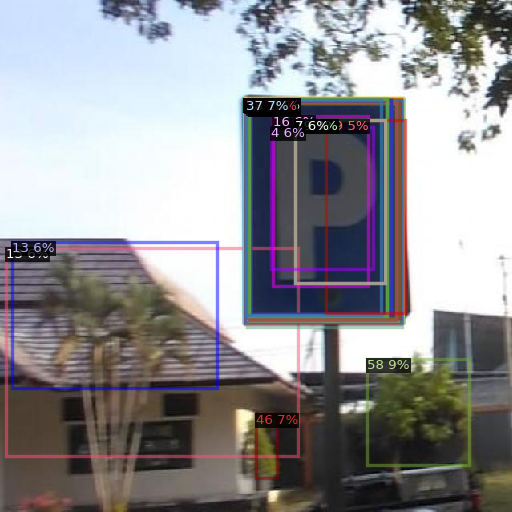

KeyboardInterrupt: 

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

[02/27 04:36:43 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [02/27 04:36:43 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 04:36:43 d2.data.datasets.coco]: Loaded 229 images in COCO format from /content/test/_annotations.coco.json
[02/27 04:36:43 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/27 04:36:43 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[02/27 04:36:43 d2.data.common]: Serializing 229 elements to byte tensors and concatenating them all ...
[02/27 04:36:43 d2.data.common]: Serialized dataset takes 0.06 MiB
[02/27 04:36:43 d2.evaluation.evaluator]: Start inference on 229 batches
[02/27 04:36:43 d2.evaluation.evaluator]: Inference done 11/229. Dataloading: 0.0012 s/iter.

AssertionError: A prediction has class=23, but the dataset only has 22 classes and predicted class id should be in [0, 21].